# 📥 Imports

In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import sklearn.feature_selection as feat_select
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
import datetime
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures

import graphviz
from graphviz import Graph

import warnings
warnings.filterwarnings("ignore")

from IPython.display import Image
from IPython.core.display import HTML

#select seaborn color pallete
sns.set_palette('PiYG')
pal = sns.set_palette('PiYG')
print(sns.color_palette().as_hex())

import wrangle as w
import explore as e

['#cf4191', '#eeadd4', '#fbe6f1', '#ebf6db', '#b0dc7d', '#62a32e']


# Using Spotify Data to Predict a Hit or a Flop

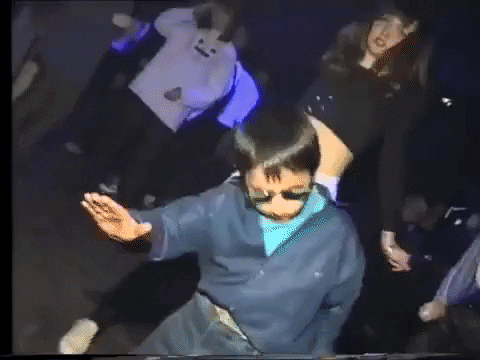

# Project Overview & Goals:
- Use classification methodologies to create a supervised machine learning model that accurately predicts whether a song will be a Hit or a Flop.
- Explore data to gain insight and provide recommendations related to drivers of a hit song.
- Create insights from data analysis and the model that will create actionable items for artists, producers or record labels to use in the creative process or when deciding if a song will be a hit or not.
- My initial hypotheses are that danceability, instrumentalness, and duration are drivers of a song being a hit.

# Executive Summary

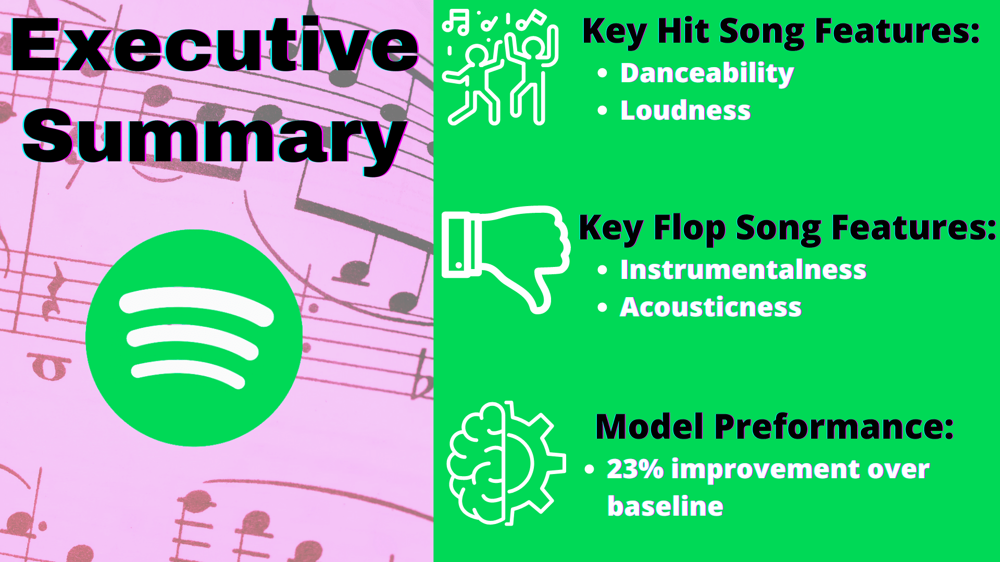

## My recommendations after working through exploratory data analysis and modeling on this data:
 - Use model to optimize song selection for singles or inclusion in albums or concert setlists.
 - Use model feature importance paired with correlation found in exploratory data analysis to determine song features during creative process.
     - Hit songs tend to be less instrumental meaning songs with words tend to be hits vs songs without words.
     - The more danceable a song, the more likely it is to be a hit
     - the higher the energy of a song, the more likely it is to be a hit.

# 📥 Acquire Data
- Data is acquired from Kaggle Spotify Hit Predictor Dataset (https://www.kaggle.com/theoverman/the-spotify-hit-predictor-dataset)
- Data is split by decade.  For the scope of this project I will use the data from all the decades 1960s - 2010s combined into one dataframe.
- In my wrangle.py file you can see the process I used to import each decade's csv add a column with the decade and combine them all into one df and create a csv.  
- I will use the function created to acquire data to pull in the data.

In [2]:
df = w.get_spotify_data()

In [3]:
df.head()

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade
0,Jealous Kind Of Fella,Garland Green,spotify:track:1dtKN6wwlolkM8XZy2y9C1,0.417,0.620,3,-7.727,1,0.0403,0.490,0.000000,0.0779,0.845,185.655,173533,3,32.94975,9,1,1960s
1,Initials B.B.,Serge Gainsbourg,spotify:track:5hjsmSnUefdUqzsDogisiX,0.498,0.505,3,-12.475,1,0.0337,0.018,0.107000,0.1760,0.797,101.801,213613,4,48.82510,10,0,1960s
2,Melody Twist,Lord Melody,spotify:track:6uk8tI6pwxxdVTNlNOJeJh,0.657,0.649,5,-13.392,1,0.0380,0.846,0.000004,0.1190,0.908,115.940,223960,4,37.22663,12,0,1960s
3,Mi Bomba Sonó,Celia Cruz,spotify:track:7aNjMJ05FvUXACPWZ7yJmv,0.590,0.545,7,-12.058,0,0.1040,0.706,0.024600,0.0610,0.967,105.592,157907,4,24.75484,8,0,1960s
4,Uravu Solla,P. Susheela,spotify:track:1rQ0clvgkzWr001POOPJWx,0.515,0.765,11,-3.515,0,0.1240,0.857,0.000872,0.2130,0.906,114.617,245600,4,21.79874,14,0,1960s


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41106 entries, 0 to 41105
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             41106 non-null  object 
 1   artist            41106 non-null  object 
 2   uri               41106 non-null  object 
 3   danceability      41106 non-null  float64
 4   energy            41106 non-null  float64
 5   key               41106 non-null  int64  
 6   loudness          41106 non-null  float64
 7   mode              41106 non-null  int64  
 8   speechiness       41106 non-null  float64
 9   acousticness      41106 non-null  float64
 10  instrumentalness  41106 non-null  float64
 11  liveness          41106 non-null  float64
 12  valence           41106 non-null  float64
 13  tempo             41106 non-null  float64
 14  duration_ms       41106 non-null  int64  
 15  time_signature    41106 non-null  int64  
 16  chorus_hit        41106 non-null  float6

# 🧹 Data Prep 

In [5]:
# Check for nulls
pd.isnull(df).sum()

track               0
artist              0
uri                 0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
chorus_hit          0
sections            0
target              0
decade              0
dtype: int64

In [6]:
#check out shape of df
df.shape

(41106, 20)

In [7]:
# Look at descriptive statistics for df
df.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
count,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,4.110600e+04,41106.000000,41106.000000,41106.000000,41106.000000
mean,0.539695,0.579545,5.213594,-10.221525,0.693354,0.072960,0.364197,0.154416,0.201535,0.542440,119.338249,2.348776e+05,3.893689,40.106041,10.475673,0.500000
std,0.177821,0.252628,3.534977,5.311626,0.461107,0.086112,0.338913,0.303530,0.172959,0.267329,29.098845,1.189674e+05,0.423073,19.005515,4.871850,0.500006
min,0.000000,0.000251,0.000000,-49.253000,0.000000,0.000000,0.000000,0.000000,0.013000,0.000000,0.000000,1.516800e+04,0.000000,0.000000,0.000000,0.000000
25%,0.420000,0.396000,2.000000,-12.816000,0.000000,0.033700,0.039400,0.000000,0.094000,0.330000,97.397000,1.729278e+05,4.000000,27.599792,8.000000,0.000000
50%,0.552000,0.601000,5.000000,-9.257000,1.000000,0.043400,0.258000,0.000120,0.132000,0.558000,117.565000,2.179070e+05,4.000000,35.850795,10.000000,0.500000
75%,0.669000,0.787000,8.000000,-6.374250,1.000000,0.069800,0.676000,0.061250,0.261000,0.768000,136.494000,2.667730e+05,4.000000,47.625615,12.000000,1.000000
max,0.988000,1.000000,11.000000,3.744000,1.000000,0.960000,0.996000,1.000000,0.999000,0.996000,241.423000,4.170227e+06,5.000000,433.182000,169.000000,1.000000


In [8]:
#change duration to seconds
df['duration_seconds'] = df.duration_ms/1000
df = df.drop(columns=['duration_ms'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41106 entries, 0 to 41105
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             41106 non-null  object 
 1   artist            41106 non-null  object 
 2   uri               41106 non-null  object 
 3   danceability      41106 non-null  float64
 4   energy            41106 non-null  float64
 5   key               41106 non-null  int64  
 6   loudness          41106 non-null  float64
 7   mode              41106 non-null  int64  
 8   speechiness       41106 non-null  float64
 9   acousticness      41106 non-null  float64
 10  instrumentalness  41106 non-null  float64
 11  liveness          41106 non-null  float64
 12  valence           41106 non-null  float64
 13  tempo             41106 non-null  float64
 14  time_signature    41106 non-null  int64  
 15  chorus_hit        41106 non-null  float64
 16  sections          41106 non-null  int64 

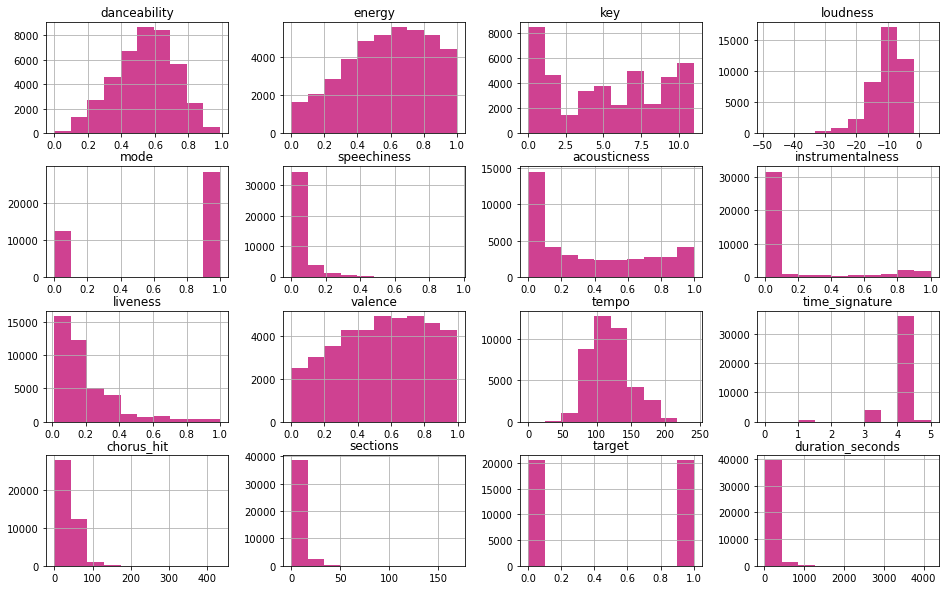

In [9]:
# Explore distribution of variables
df.hist(figsize=(16,10))
plt.show()

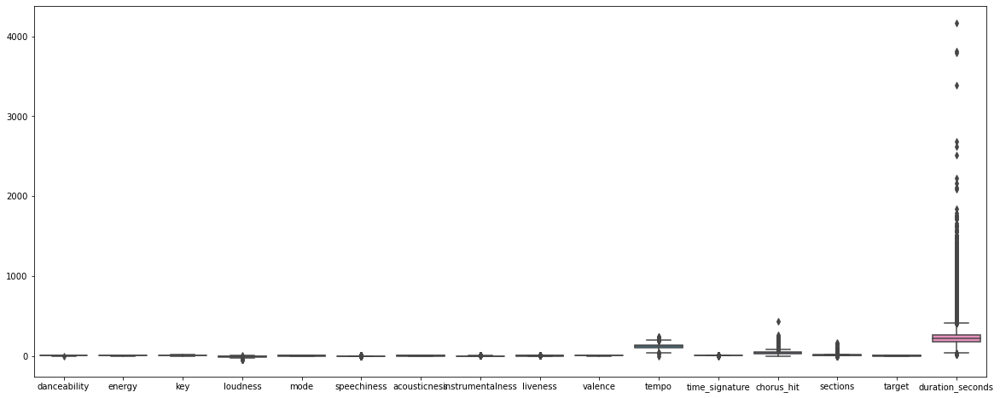

In [10]:
# Explore Boxplot of Variables
plt.figure(figsize=(20,8))

plt.ticklabel_format(useOffset=False, style='plain')
sns.boxplot(data=df)

plt.show()

### Initial Univariate Exploration Takeaways:
- There seem to be outliers in duration, chorus hit, tempo, loudness, sections, and spechiness columns.
- I will use a function to remove the outliers using the IQR method and take another look at the histogram and box plots of the df to see the impact.

### Remove Outliers

In [11]:
#remove outliers using function from wrangle.py
df = w.remove_outliers(df, .7, ['duration_seconds', 'chorus_hit', 'tempo', 'loudness', 'sections', 'speechiness'])

## Univariate Exploration with Outliers Removed

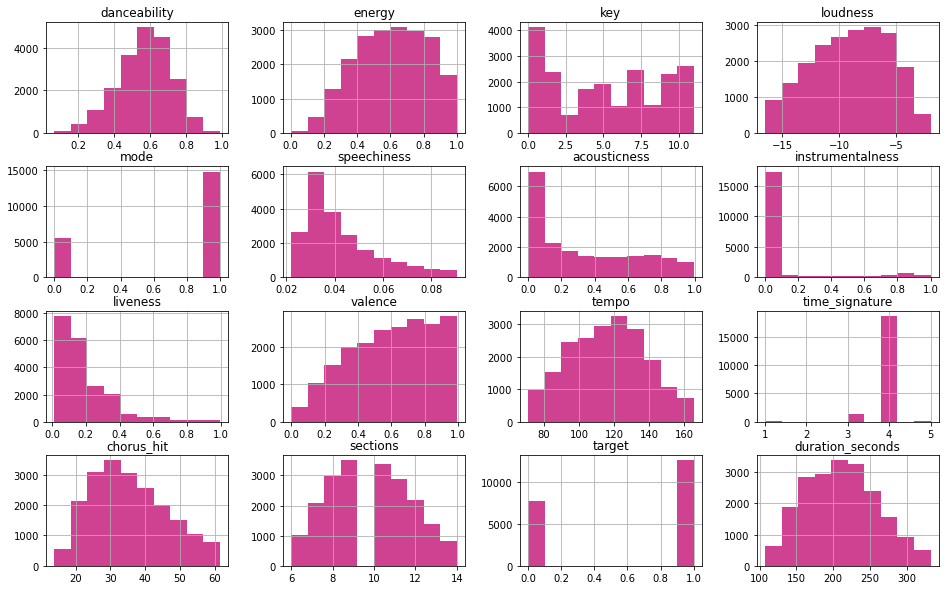

In [12]:
df.hist(figsize=(16,10))
plt.show()

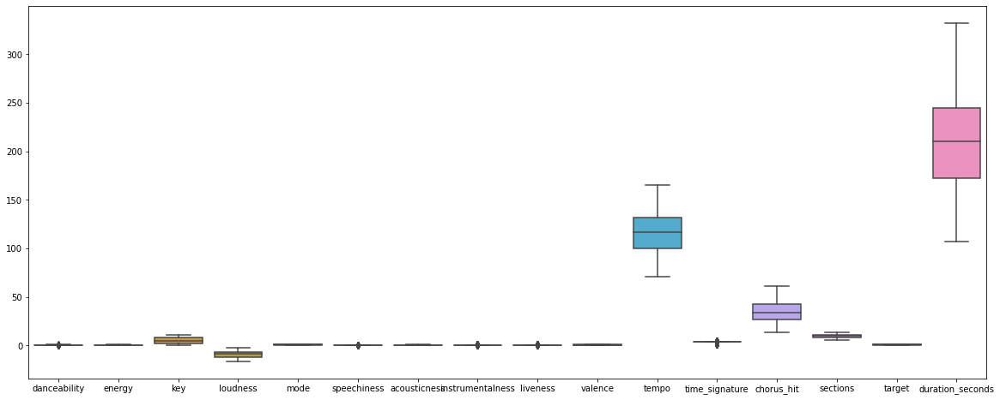

In [13]:
plt.figure(figsize=(20,8))

plt.ticklabel_format(useOffset=False, style='plain')
sns.boxplot(data=df)

plt.show()

# ✂️ Split Data

In [14]:
# split into train validate and test 
train, validate, test = w.train_validate_test_split(df, target='target', seed=123)

train -> (11352, 20)
validate -> (4866, 20)
test -> (4055, 20)


# ⚖️ Scale Data

In [15]:
scaler, scaled_columns = w.tip_the_scale(train, validate, test, ['duration_seconds', 'tempo'], MinMaxScaler(), 'min_max')

In [16]:
train.head()

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,...,valence,tempo,time_signature,chorus_hit,sections,target,decade,duration_seconds,duration_seconds_min_max,tempo_min_max
18086,A Nickel And A Nail - Live / 1983,Otis Clay,spotify:track:6hjPzETLQGN32K00MAdkcI,0.673,0.630,0,-12.777,1,0.0466,0.3240,...,0.802,97.563,4,26.56221,12,0,1980s,305.400,0.880084,0.282350
30559,Whats Happnin!,Ying Yang Twins Featuring Trick Daddy,spotify:track:6QVDBajBKQAz7RSS66k4vF,0.828,0.672,6,-6.456,1,0.0543,0.0988,...,0.776,107.996,4,24.32226,10,1,2000s,259.733,0.677261,0.392537
36671,Make Me Like You,Gwen Stefani,spotify:track:2WIxwn8LZRI7knO1VbwdaE,0.741,0.714,5,-4.739,0,0.0476,0.0403,...,0.799,118.036,4,59.40530,7,1,2010s,216.947,0.487233,0.498574
35718,La La La,Naughty Boy Featuring Sam Smith,spotify:track:36pLU2ywVeBKEF0rrKtmCB,0.772,0.650,6,-5.202,0,0.0306,0.1070,...,0.262,125.082,4,25.46199,10,1,2010s,222.200,0.510564,0.572990
6212,Nobody I Know,Peter And Gordon,spotify:track:7hW7DZ42AY4suLWXymcnXe,0.589,0.787,4,-8.692,0,0.0297,0.6480,...,0.795,131.584,4,49.70964,7,1,1960s,150.453,0.191911,0.641661


# 🕵🏻‍♀️ Explore

## Create Explore Dataframe with columns to explore

In [17]:
explore_train = train[['danceability', 'energy', 'key', 'tempo_min_max', 'time_signature', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence','target', 'decade','chorus_hit', 'sections',
       'duration_seconds_min_max']]

In [18]:
explore_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11352 entries, 18086 to 37092
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   danceability              11352 non-null  float64
 1   energy                    11352 non-null  float64
 2   key                       11352 non-null  int64  
 3   tempo_min_max             11352 non-null  float64
 4   time_signature            11352 non-null  int64  
 5   loudness                  11352 non-null  float64
 6   mode                      11352 non-null  int64  
 7   speechiness               11352 non-null  float64
 8   acousticness              11352 non-null  float64
 9   instrumentalness          11352 non-null  float64
 10  liveness                  11352 non-null  float64
 11  valence                   11352 non-null  float64
 12  target                    11352 non-null  int64  
 13  decade                    11352 non-null  object 
 14  ch

# Explore Relationship between variables and the target, Hit or Flop

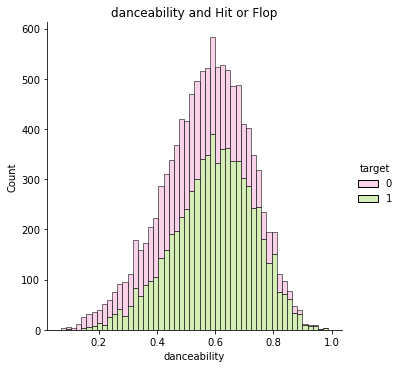

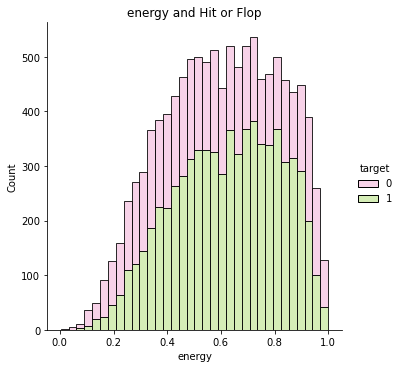

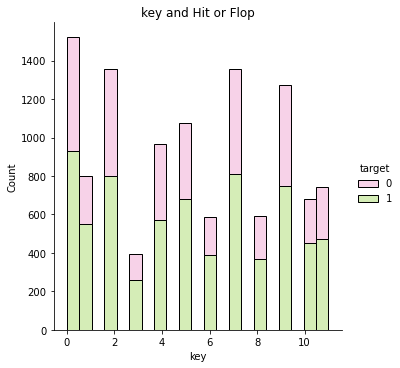

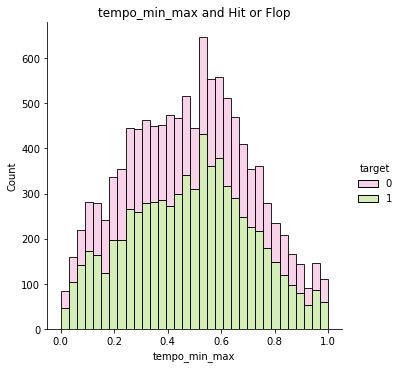

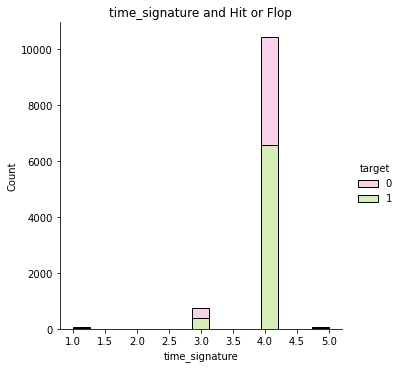

...

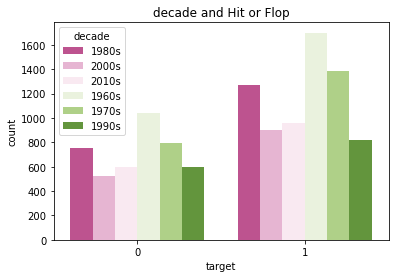

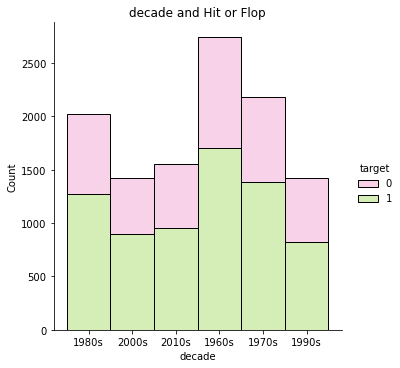

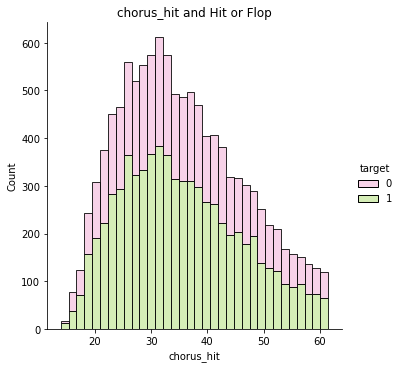

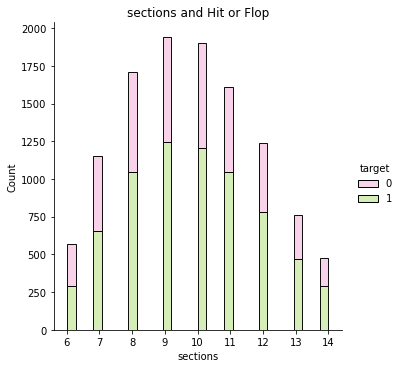

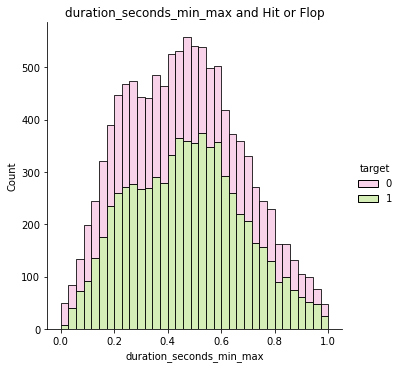

In [19]:
e.subplot(explore_train)

### 📊 Countplot and Displot Takeaways:
- There are more hits than flops which seems skewed compared to what I feel would be true when looking at all songs.
- The decade with the most hits is the 1960s followed by the 80s
- The more danceable a song is, the higher the ratio of hits
- It appears as valance increases for a song it is more likely to be a hit
- As danceability increases it appears that a song is more likely to be a hit

## Pairplots

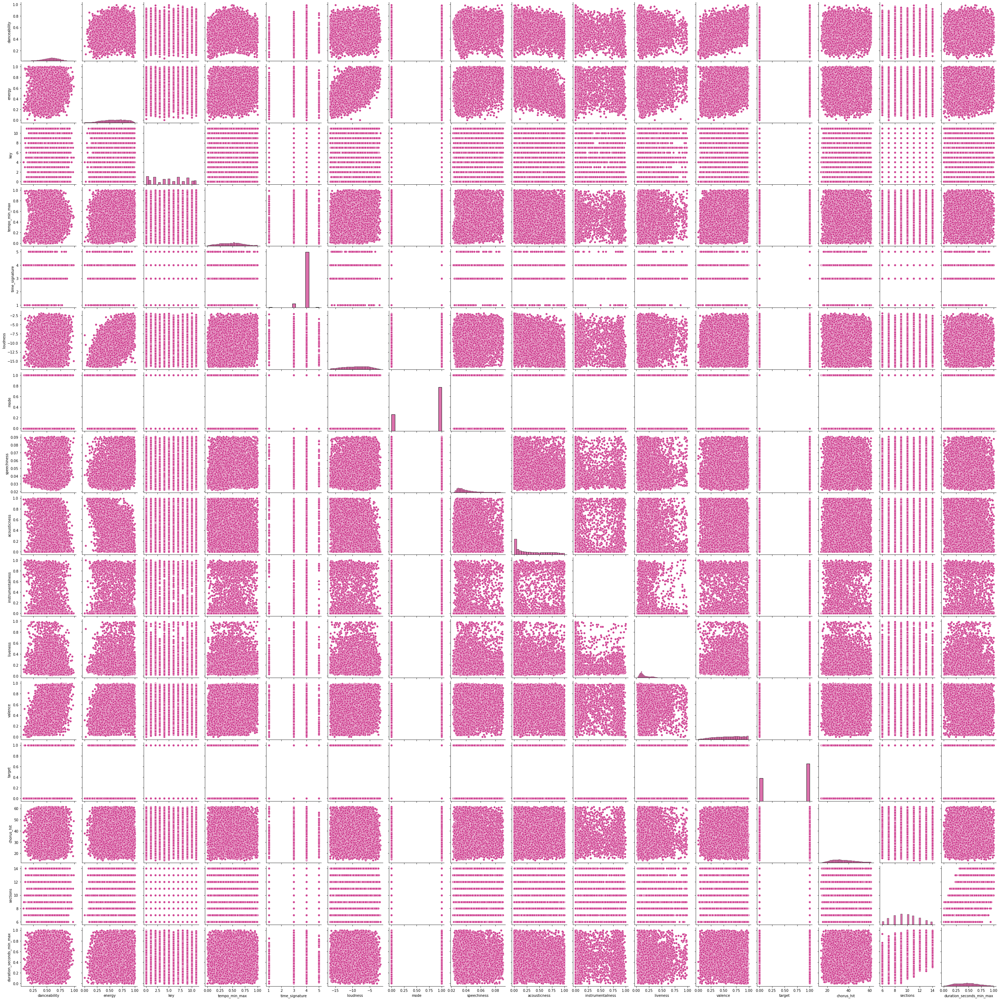

In [20]:
# Look at pairplot of all variables
sns.pairplot(explore_train)
plt.show()

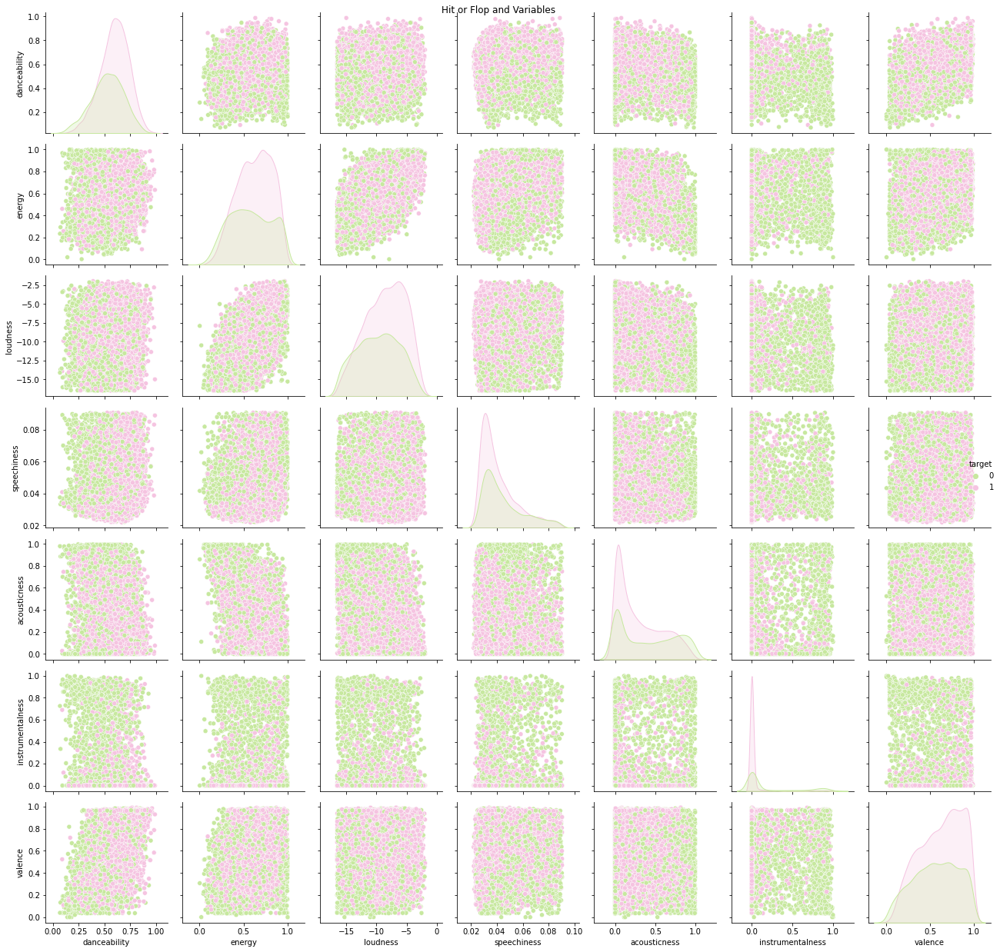

In [21]:
# Explore select Variables in relation to target
sns.pairplot(explore_train, vars = ['danceability', 'energy', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'valence'], hue = 'target', palette=('PiYG_r'))
plt.suptitle('Hit or Flop and Variables')
plt.tight_layout()
plt.show()

## 📈 Pairplot Takeaways:
- It appears the less instrumental the more likely it is to be a hit.
- There seems to be something interesting happening with danceability and valance and loudness and energy

## 🔍 Compare Means of Variables for Hits and Flops

In [22]:
features_var_list = ['danceability', 'energy', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo_min_max',
       'chorus_hit', 'sections', 'duration_seconds_min_max']

In [23]:
# seperate into hits and flops based on target
all_songs_hits = explore_train[features_var_list].loc[explore_train['target'] == 1]
all_songs_flops = explore_train[features_var_list].loc[explore_train['target'] == 0]

In [24]:
#create a dataframe that includes the means for hits and flops
hits_means = pd.DataFrame(all_songs_hits.describe().loc['mean'])
flops_means = pd.DataFrame(all_songs_flops.describe().loc['mean'])
means_joined = pd.concat([hits_means,flops_means], axis = 1)
means_joined.columns = ['hit_mean', 'flop_mean']

means_joined

,hit_mean,flop_mean
danceability,0.594783,0.527364
energy,0.622600,0.576234
loudness,-8.604221,-9.761302
speechiness,0.041411,0.045060
acousticness,0.295324,0.406513
instrumentalness,0.029045,0.194360
liveness,0.189732,0.198748
valence,0.617575,0.561590
tempo_min_max,0.482152,0.475945
chorus_hit,35.366694,35.828998


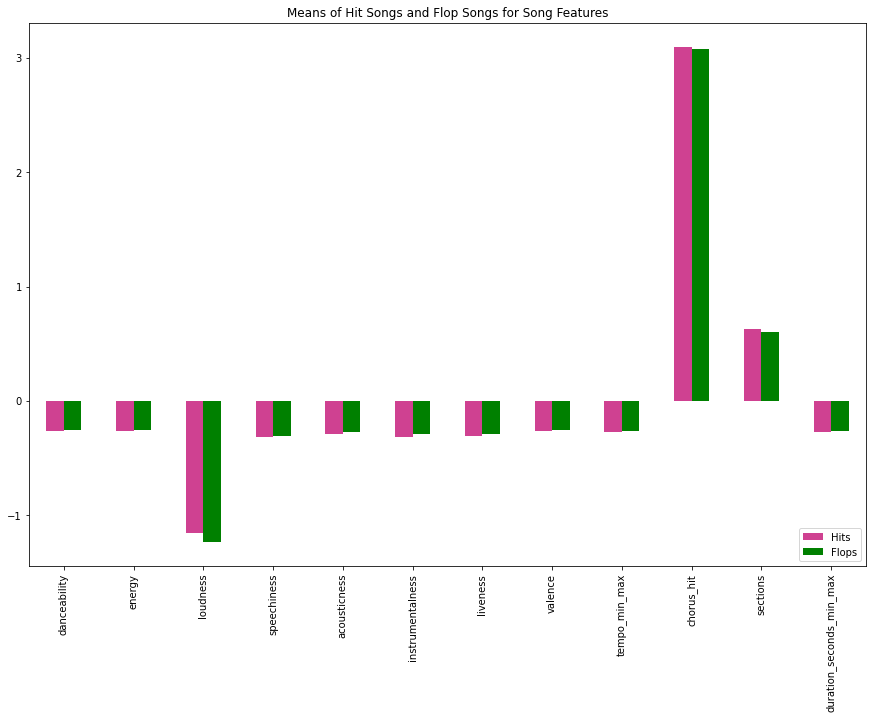

In [25]:
#scale the dataframe to make the graph more readable and graph results
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
means_joined_scaled = pd.DataFrame(ss.fit_transform(means_joined),index= means_joined.index, columns = means_joined.columns)
means_joined_scaled

means_joined_scaled.plot(kind = 'bar', figsize=(15, 10), color = ('#cf4191', 'green'), title = 'Means of Hit Songs and Flop Songs for Song Features')
plt.legend(labels=['Hits', 'Flops'], loc='lower right')
plt.show()
plt.show()

### Hit vs Flop Means Comparison Takeaways:
- There are differnces in the means between hits and flops, but the differences are subtle.
- Loudness has the biggest differnce between means between hits and flops

## 🔥 Correlation Heatmaps

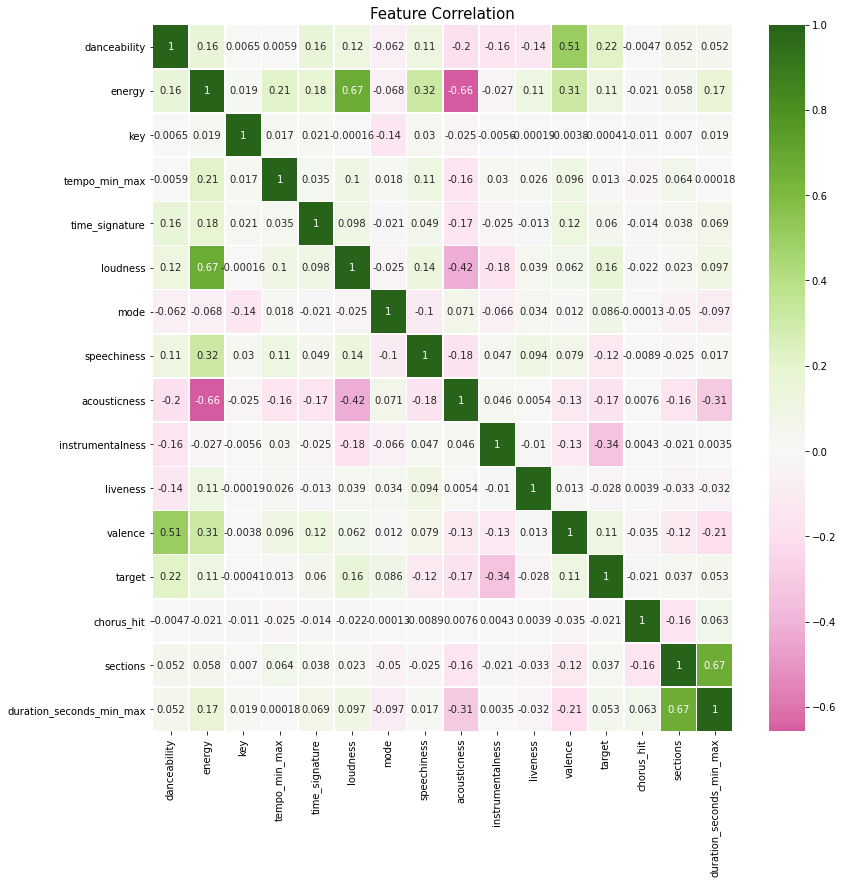

In [26]:
#correlation heat map of variables
f, ax = plt.subplots(figsize=(13,13))
sns.heatmap(explore_train.corr(), annot=True, center=0, linewidth=.5, ax=ax, cmap="PiYG")
plt.title('Feature Correlation', fontsize=15)
plt.show()

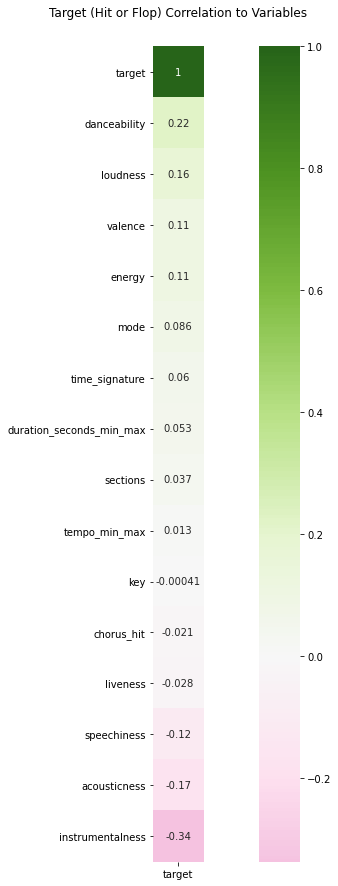

In [27]:
c_heatmap = pd.DataFrame(explore_train.corr()['target'])
plt.figure(figsize = [20,15])
sns.heatmap(c_heatmap.sort_values(by = 'target',ascending = False), center = 0, cmap='PiYG', annot=True, square = True)
plt.title('Target (Hit or Flop) Correlation to Variables', pad = 30)
plt.show()

### 🔥 Correlation Heatmap Takeaways:
- Instrumentalness seems to be a driver of a flop
- Danceability, loudness, energey and valence are the most highly correlated features to hit songs
- There were not a lot of surprises when looking at feature correlation.

## 🧮 Statistical Tests
- I will do a chi squared test on the relationship between being a hit song and the decde to see if splitting the data by decade in the future could be helpful.
- I will also do a two-sample T-Test comparing the relationship between danceability and the song being a hit or flop.  This was one of my initial hypotheses.

## Test One - Decade and Target of Hit or Flop
$H_{0}$: Decade IS NOT independent of the target of Hit or Flop.

$H_{a}$ : Decade IS independent of the target of Hit or Flop.

In [28]:
alpha = .5
observed = pd.crosstab(explore_train['decade'], train['target'])
observed

target,0,1
decade,,
1960s,1045,1700
1970s,791,1388
1980s,754,1272
1990s,600,820
2000s,526,901
2010s,599,956


In [29]:
chi2, p, degf, expected = stats.chi2_contingency(observed)

In [30]:
print('Observed:\n')
print(observed)
print('~~~~~~~~~~~~~~~~~~~~~~')
print('Expected: \n')
print(pd.DataFrame(expected, index=observed.index, columns=observed.columns))
print('~~~~~~~~~~~~~~~~~~~~~~')
print(f'chi^2 value: {chi2:.4f}')
print(f'p value: {p:.8f}')
print(f'degrees of freedom: {degf}')
if p < alpha:
    print('''Our p value is less than our alpha and we can reject the null hypothesis
         We can suggest that decade is not independent of the target of Hit or Flop''')
else:
    print('We cannot reject the null hypothesis')

Observed:

target     0     1
decade            
1960s   1045  1700
1970s    791  1388
1980s    754  1272
1990s    600   820
2000s    526   901
2010s    599   956
~~~~~~~~~~~~~~~~~~~~~~
Expected: 

target            0            1
decade                          
1960s   1043.399841  1701.600159
1970s    828.258016  1350.741984
1980s    770.101304  1255.898696
1990s    539.755109   880.244891
2000s    542.415874   884.584126
2010s    591.069856   963.930144
~~~~~~~~~~~~~~~~~~~~~~
chi^2 value: 15.0713
p value: 0.01006200
degrees of freedom: 5
Our p value is less than our alpha and we can reject the null hypothesis
         We can suggest that decade is not independent of the target of Hit or Flop


## Test Two - T-Test: Danceability and Target of Hit or Miss
$H_{0}$: There IS difference in the danceability of songs that are hits and those that are flops.

$H_{a}$ : There IS difference in the danceability of songs that are hits and those that are flops.


In [31]:
alpha = .05

null_hypothesis = 'There IS difference in the danceability of songs that are hits and those that are flops.'

alternative_hypothesis = 'There IS difference in the danceability of songs that are hits and those that are flops.'

In [32]:
danceability_hit = train[train.target == 1].danceability
danceability_hit

30559    0.828
36671    0.741
35718    0.772
6212     0.589
10663    0.855
         ...  
16689    0.840
10080    0.601
5054     0.253
11451    0.486
37092    0.651
Name: danceability, Length: 7037, dtype: float64

In [33]:
danceability_flop = danceability_hit = train[train.target == 0].danceability
danceability_flop

18086    0.673
10899    0.523
11866    0.346
18469    0.343
29402    0.250
         ...  
28001    0.727
3088     0.400
19167    0.780
10016    0.551
35407    0.353
Name: danceability, Length: 4315, dtype: float64

In [34]:
stats.ttest_ind(danceability_hit, danceability_flop)

Ttest_indResult(statistic=0.0, pvalue=1.0)

In [35]:
if p < alpha:
    print("We reject the null hypothesis that", null_hypothesis)
    print("We move forward with the alternative hypothesis that", alternative_hypothesis)
else:
    print("We fail to reject the null")
    print("Our evidence does not support the claim that danceability is different between hits and flops")

We reject the null hypothesis that There IS difference in the danceability of songs that are hits and those that are flops.
We move forward with the alternative hypothesis that There IS difference in the danceability of songs that are hits and those that are flops.


# ⚙️ Modeling

In [36]:
# Pull in data prepped for modeling using function from my wrangle.py file
train, validate, test = w.prep_spotify_model(df)

train -> (11352, 22)
validate -> (4866, 22)
test -> (4055, 22)


In [37]:
#scale data using scaler function
scaler, scaled_columns = w.tip_the_scale(train, validate, test, ['duration_seconds', 'tempo'], MinMaxScaler(), 'min_max')

In [38]:
# check shape of df
train.shape, validate.shape, test.shape

((11352, 24), (4866, 24), (4055, 24))

In [39]:
#drop non scaled columns
train = train.drop(columns =['duration_seconds', 'tempo'])
validate = validate.drop(columns =['duration_seconds', 'tempo'])
test = test.drop(columns =['duration_seconds', 'tempo'])

In [40]:
#check for encoded columns and scaled columns
train.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,sections,target,decade_1960s,decade_1970s,decade_1980s,decade_1990s,decade_2000s,decade_2010s,duration_seconds_min_max,tempo_min_max
18086,0.673,0.630,0,-12.777,1,0.0466,0.3240,0.006570,0.6280,0.802,...,12,0,0,0,1,0,0,0,0.880084,0.282350
30559,0.828,0.672,6,-6.456,1,0.0543,0.0988,0.000000,0.3910,0.776,...,10,1,0,0,0,0,1,0,0.677261,0.392537
36671,0.741,0.714,5,-4.739,0,0.0476,0.0403,0.000016,0.1270,0.799,...,7,1,0,0,0,0,0,1,0.487233,0.498574
35718,0.772,0.650,6,-5.202,0,0.0306,0.1070,0.000001,0.0905,0.262,...,10,1,0,0,0,0,0,1,0.510564,0.572990
6212,0.589,0.787,4,-8.692,0,0.0297,0.6480,0.000000,0.2020,0.795,...,7,1,1,0,0,0,0,0,0.191911,0.641661


In [41]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11352 entries, 18086 to 37092
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   danceability              11352 non-null  float64
 1   energy                    11352 non-null  float64
 2   key                       11352 non-null  int64  
 3   loudness                  11352 non-null  float64
 4   mode                      11352 non-null  int64  
 5   speechiness               11352 non-null  float64
 6   acousticness              11352 non-null  float64
 7   instrumentalness          11352 non-null  float64
 8   liveness                  11352 non-null  float64
 9   valence                   11352 non-null  float64
 10  time_signature            11352 non-null  int64  
 11  chorus_hit                11352 non-null  float64
 12  sections                  11352 non-null  int64  
 13  target                    11352 non-null  int64  
 14  de

# 🎯 Establish Baseline

In [42]:
# determine most frequent occurance between hit or flop
train.target.mode()

0    1
dtype: int64

In [43]:
# inputs baseline values and then calculates the accuracy compared to the actual hit song rates
# use explore_train, so it doesn't add baseline to the train df you are modeling on, 
# as this will create discrepency between train, validate and test column numbers. 
explore_train['baseline'] = 1
baseline_accuracy = (explore_train.baseline == explore_train.target).mean()
print(f'Baseline accuracy is {baseline_accuracy:.2%}')

Baseline accuracy is 61.99%


## 🔮 Predictions Explained Four Ways:
- True Positive: True Positive. We predicted the song was a hit & it was a hit.
- True Negative: True Negative. We predicted the song was a flop & it was a flop.
- False Positive: False Positive. We predicted the song was a hit & it was a flop.
- False Negative: False Negative. We predicted the song was a flop & it was a hit.

#### The focus for the models is to optimize recall to maximize the amount of positive cases it predicts.  A positive case is a hit.  By predicting which songs are hits, we can use that to strategize what songs should be singles or part of an album, or features that are highly correlated with a hit can be used during creative process.

In [44]:
# create X & y version of train, where y is a series with just the target variable and X are all the features. 

X_train = train.drop(columns=['target'])
y_train = train.target

X_validate = validate.drop(columns=['target'])
y_validate = validate.target

X_test = test.drop(columns=['target'])
y_test = test.target

In [45]:
# check shape to ensure everything looks good.
X_train.shape, y_train.shape, X_validate.shape, y_validate.shape, X_test.shape, y_test.shape

((11352, 21), (11352,), (4866, 21), (4866,), (4055, 21), (4055,))

# 🌲🌲 Random Forest Model

In [46]:
#Create the object
rf = RandomForestClassifier(bootstrap=True, 
                            class_weight=None, 
                            criterion='gini',
                            min_samples_leaf=5,
                            n_estimators=100,
                            max_depth=15, 
                            random_state=123)

In [47]:
# fit the model
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=15, min_samples_leaf=5, random_state=123)

In [48]:
# make predictions
y_pred = rf.predict(X_train)

In [49]:
# estimate probability
y_pred_proba = rf.predict_proba(X_train)

## 🕵🏻‍♀️ Evaluate the Model on in (train) and out of sample data (validate)

In [50]:
e.model_metrics(X_train, y_train, rf, data_set = 'train')

train accuracy score: 88.17%
train precision score 85.43%
train recall score: 97.56%

-------------------------------
classification report
              precision    recall  f1-score   support

           0       0.95      0.73      0.82      4315
           1       0.85      0.98      0.91      7037

    accuracy                           0.88     11352
   macro avg       0.90      0.85      0.87     11352
weighted avg       0.89      0.88      0.88     11352

-------------------------------

confusion matrix
[[3144 1171]
 [ 172 6865]]

train model metrics
---------------------------------
True positive rate for the model is 97.56%
False positive rate for the model is  27.14%
True negative rate for the model is 72.86%
False negative rate for the model is 2.44%



In [51]:
 e.model_metrics(X_validate, y_validate, rf, data_set = 'validate')

validate accuracy score: 76.94%
validate precision score 75.99%
validate recall score: 91.81%

-------------------------------
classification report
              precision    recall  f1-score   support

           0       0.80      0.53      0.63      1850
           1       0.76      0.92      0.83      3016

    accuracy                           0.77      4866
   macro avg       0.78      0.72      0.73      4866
weighted avg       0.77      0.77      0.76      4866

-------------------------------

confusion matrix
[[ 975  875]
 [ 247 2769]]

validate model metrics
---------------------------------
True positive rate for the model is 91.81%
False positive rate for the model is  47.30%
True negative rate for the model is 52.70%
False negative rate for the model is 8.19%



### Random Forest One Model Takeaways:
- The model beats baseline in both in and out of sample data.
- Accuracy decreases by 11% between in and out of sample data
- the false positive rate incresed on the validate data
- the true negative rate decresed when model was tested on validate data

## 🔁 Random Forest Loop of Iterations

In [52]:
# Let's compare in-sample to out-of-sample
metrics = []
max_depth = 20

for i in range(2, max_depth):
    # Make the model
    depth = max_depth - i
    n_samples = i
    forest = RandomForestClassifier(max_depth=depth, min_samples_leaf=n_samples, random_state=123)

    # Fit the model (on train and only train)
    forest = forest.fit(X_train, y_train)

    # Use the model
    # We'll evaluate the model's performance on train, first
    in_sample_accuracy = forest.score(X_train, y_train)
    
    out_of_sample_accuracy = forest.score(X_validate, y_validate)

    output = {
        "min_samples_per_leaf": n_samples,
        "max_depth": depth,
        "train_accuracy": in_sample_accuracy,
        "validate_accuracy": out_of_sample_accuracy
    }
    
    metrics.append(output)
    
rf_metrics_df = pd.DataFrame(metrics)
rf_metrics_df["difference"] = rf_metrics_df.train_accuracy - rf_metrics_df.validate_accuracy
rf_metrics_df

,min_samples_per_leaf,max_depth,train_accuracy,validate_accuracy,difference
0,2,18,0.961240,0.774558,0.186682
1,3,17,0.932787,0.774969,0.157818
2,4,16,0.904863,0.773325,0.131537
3,5,15,0.881695,0.769420,0.112274
4,6,14,0.859320,0.768393,0.090927
5,7,13,0.843023,0.767982,0.075041
6,8,12,0.829369,0.762022,0.067347
7,9,11,0.815539,0.764899,0.050640
8,10,10,0.801180,0.758323,0.042857
9,11,9,0.789993,0.755857,0.034136


##  🌲🌲 Random Forest Model 2 based on Findings Above

In [53]:
#Create the object
rf2 = RandomForestClassifier(bootstrap=True, 
                            class_weight=None, 
                            criterion='gini',
                            min_samples_leaf=6,
                            n_estimators=100,
                            max_depth=14, 
                            random_state=123)
# fit the model
rf2.fit(X_train, y_train)

# make predictions
y_pred = rf2.predict(X_validate)

# estimate probability
y_pred_proba = rf2.predict_proba(X_validate)

## 🕵🏻‍♀️ Evaluate the Model on in (train) and out of sample data (validate)

In [54]:
e.model_metrics(X_train, y_train, rf2, data_set = 'train')

train accuracy score: 85.93%
train precision score 83.01%
train recall score: 97.20%

-------------------------------
classification report
              precision    recall  f1-score   support

           0       0.94      0.68      0.78      4315
           1       0.83      0.97      0.90      7037

    accuracy                           0.86     11352
   macro avg       0.88      0.82      0.84     11352
weighted avg       0.87      0.86      0.85     11352

-------------------------------

confusion matrix
[[2915 1400]
 [ 197 6840]]

train model metrics
---------------------------------
True positive rate for the model is 97.20%
False positive rate for the model is  32.44%
True negative rate for the model is 67.56%
False negative rate for the model is 2.80%



In [55]:
 e.model_metrics(X_validate, y_validate, rf2, data_set = 'validate')

validate accuracy score: 76.84%
validate precision score 75.58%
validate recall score: 92.54%

-------------------------------
classification report
              precision    recall  f1-score   support

           0       0.81      0.51      0.63      1850
           1       0.76      0.93      0.83      3016

    accuracy                           0.77      4866
   macro avg       0.78      0.72      0.73      4866
weighted avg       0.78      0.77      0.75      4866

-------------------------------

confusion matrix
[[ 948  902]
 [ 225 2791]]

validate model metrics
---------------------------------
True positive rate for the model is 92.54%
False positive rate for the model is  48.76%
True negative rate for the model is 51.24%
False negative rate for the model is 7.46%



### Random Forest Two Model Takeaways:
- The model beats baseline in both in and out of sample data.
- Accuracy decreases by 9% between in and out of sample data
- the false positive rate incresed on the validate data
- the true negative rate decresed when model was tested on validate data


# 🌳 Decision Tree Model

## 🔁 Loop to Find Optimal Parameters for In and Out of Sample Data

In [56]:
# compare in-sample to out-of-sample
metrics = []

for i in range(2, 25):
    # Make the model
    tree = DecisionTreeClassifier(max_depth=i, random_state=123)

    # Fit the model (on train and only train)
    tree = tree.fit(X_train, y_train)

    # Use the model
    # We'll evaluate the model's performance on train, first
    in_sample_accuracy = tree.score(X_train, y_train)
    
    out_of_sample_accuracy = tree.score(X_validate, y_validate)

    output = {
        "max_depth": i,
        "train_accuracy": in_sample_accuracy,
        "validate_accuracy": out_of_sample_accuracy
    }
    
    metrics.append(output)
    
tree_metric_df = pd.DataFrame(metrics)
tree_metric_df["difference"] = tree_metric_df.train_accuracy - tree_metric_df.validate_accuracy
tree_metric_df

,max_depth,train_accuracy,validate_accuracy,difference
0,2,0.710800,0.705508,0.005292
1,3,0.721371,0.712495,0.008876
2,4,0.738020,0.726675,0.011345
3,5,0.745155,0.734690,0.010465
4,6,0.756431,0.731607,0.024824
5,7,0.774577,0.737978,0.036599
6,8,0.792283,0.732840,0.059443
7,9,0.813249,0.731196,0.082053
8,10,0.833862,0.732018,0.101844
9,11,0.853770,0.727497,0.126273


### Parameter Loop Takeaways:
- I will use a max depth of 8 based on the results above to use as my decision tree model

In [57]:
# Make the model
tree1 = DecisionTreeClassifier(max_depth=8, random_state=123)

# Fit the model
tree1 = tree1.fit(X_train, y_train)

# Use the model
# We'll evaluate the model's performance on train, first
y_predictions = tree1.predict(X_train)

# Print classification report on the actual y values and this model's predicted y values
report = classification_report(y_train, y_predictions, output_dict=True)
print("Tree of 8 depth")
pd.DataFrame(report)

Tree of 8 depth


,0,1,accuracy,macro avg,weighted avg
precision,0.824759,0.780549,0.792283,0.802654,0.797354
recall,0.575898,0.924968,0.792283,0.750433,0.792283
f1-score,0.678221,0.846644,0.792283,0.762432,0.782625
support,4315.000000,7037.000000,0.792283,11352.000000,11352.000000


## 🕵🏻‍♀️ Evaluate the Model on in (train) and out of sample data (validate)

In [58]:
e.model_metrics(X_train, y_train, tree1, data_set = 'train')

train accuracy score: 79.23%
train precision score 78.05%
train recall score: 92.50%

-------------------------------
classification report
              precision    recall  f1-score   support

           0       0.82      0.58      0.68      4315
           1       0.78      0.92      0.85      7037

    accuracy                           0.79     11352
   macro avg       0.80      0.75      0.76     11352
weighted avg       0.80      0.79      0.78     11352

-------------------------------

confusion matrix
[[2485 1830]
 [ 528 6509]]

train model metrics
---------------------------------
True positive rate for the model is 92.50%
False positive rate for the model is  42.41%
True negative rate for the model is 57.59%
False negative rate for the model is 7.50%



In [59]:
 e.model_metrics(X_validate, y_validate, tree1, data_set = 'validate')

validate accuracy score: 73.28%
validate precision score 73.56%
validate recall score: 88.83%

-------------------------------
classification report
              precision    recall  f1-score   support

           0       0.72      0.48      0.58      1850
           1       0.74      0.89      0.80      3016

    accuracy                           0.73      4866
   macro avg       0.73      0.68      0.69      4866
weighted avg       0.73      0.73      0.72      4866

-------------------------------

confusion matrix
[[ 887  963]
 [ 337 2679]]

validate model metrics
---------------------------------
True positive rate for the model is 88.83%
False positive rate for the model is  52.05%
True negative rate for the model is 47.95%
False negative rate for the model is 11.17%



### 🌳 Decision Tree Model Takeaways
- The model beats baseline in both in and out of sample data.
- Accuracy decreases by 5.8% between in and out of sample data
- the false positive rate incresed on the validate data
- the true negative rate decresed when model was tested on validate data

# 🏘 K Nearest Neighbor Model

### 📈 🔁 Visualize K to determine KNN model parameters

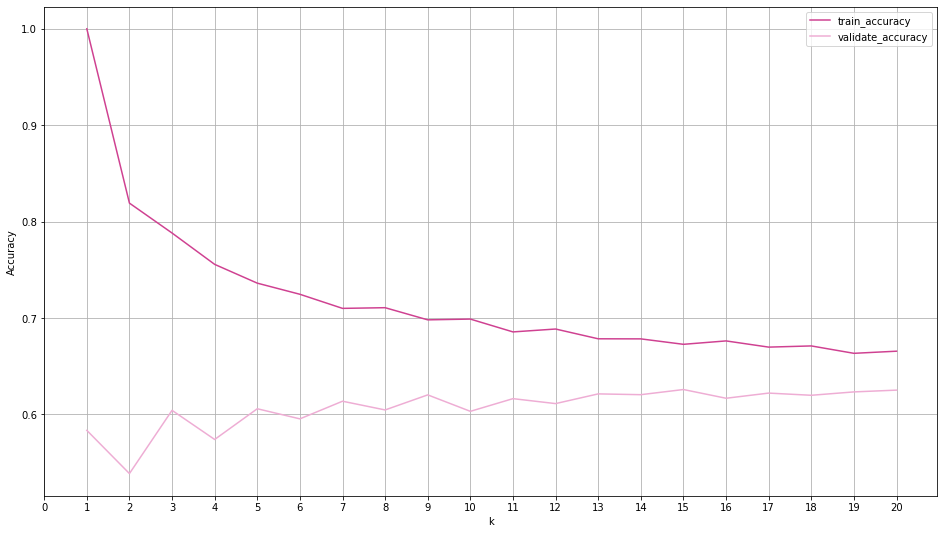

In [60]:
metrics = []

# loop through different values of k
for k in range(1, 21):
            
    # define the thing
    knn = KNeighborsClassifier(n_neighbors=k)
    
    # fit the thing (remmeber only fit on training data)
    knn.fit(X_train, y_train)
    
    # use the thing (calculate accuracy)
    train_accuracy = knn.score(X_train, y_train)
    validate_accuracy = knn.score(X_validate, y_validate)
    
    output = {
        "k": k,
        "train_accuracy": train_accuracy,
        "validate_accuracy": validate_accuracy
    }
    
    metrics.append(output)

# make a dataframe
results = pd.DataFrame(metrics)

# plot the data
results.set_index('k').plot(figsize = (16,9))
plt.ylabel('Accuracy')
plt.xticks(np.arange(0,21,1))
plt.grid()

In [61]:
results

,k,train_accuracy,validate_accuracy
0,1,0.999824,0.583436
1,2,0.819063,0.538635
2,3,0.788055,0.604192
3,4,0.755550,0.573983
4,5,0.736082,0.605836
5,6,0.724542,0.595356
6,7,0.709919,0.613646
7,8,0.710624,0.604603
8,9,0.698027,0.620222
9,10,0.698820,0.603165


### 🔁 Optimal Features Loop Takeaways:
- I will use k = 7 on my KNN model

In [62]:
#create object:
knn1 = KNeighborsClassifier(n_neighbors=7, weights='uniform')

#fit the model to training data
knn1.fit(X_train, y_train)

#make predictions
y_pred = knn1.predict(X_train)

#estimate probability
y_pred_proba = knn1.predict_proba(X_train)

## 🕵🏻‍♀️ Evaluate the Model on in (train) and out of sample data (validate)

In [63]:
e.model_metrics(X_train, y_train, knn1, data_set = 'train')

train accuracy score: 70.99%
train precision score 71.13%
train recall score: 89.56%

-------------------------------
classification report
              precision    recall  f1-score   support

           0       0.71      0.41      0.52      4315
           1       0.71      0.90      0.79      7037

    accuracy                           0.71     11352
   macro avg       0.71      0.65      0.65     11352
weighted avg       0.71      0.71      0.69     11352

-------------------------------

confusion matrix
[[1757 2558]
 [ 735 6302]]

train model metrics
---------------------------------
True positive rate for the model is 89.56%
False positive rate for the model is  59.28%
True negative rate for the model is 40.72%
False negative rate for the model is 10.44%



In [64]:
e.model_metrics(X_validate, y_validate, knn1, data_set = 'validate')

validate accuracy score: 61.36%
validate precision score 64.72%
validate recall score: 82.82%

-------------------------------
classification report
              precision    recall  f1-score   support

           0       0.49      0.26      0.34      1850
           1       0.65      0.83      0.73      3016

    accuracy                           0.61      4866
   macro avg       0.57      0.55      0.53      4866
weighted avg       0.59      0.61      0.58      4866

-------------------------------

confusion matrix
[[ 488 1362]
 [ 518 2498]]

validate model metrics
---------------------------------
True positive rate for the model is 82.82%
False positive rate for the model is  73.62%
True negative rate for the model is 26.38%
False negative rate for the model is 17.18%



## 🏘 KNN Model Takeaways:
- The model beats baseline in both in and out of sample data
- This model has the lowest accuracy of all the models
- Accuracy decreases by 10% between in and out of sample data
- The false positive rate incresed & true negative rate decreased on the validate data

# 🌲🏆🌲 Test Random Forest Model 2 on Test Data Set
- This model was chosen because it had a high level of accuracy and difference of 9% between in and out of sample data
- It also had high recal, which was one of the goals of the models.

## 🕵🏻‍♀️ Let's see how it does on the test data!  Fingers Crossed 🤞🏼

In [65]:
e.model_metrics(X_test, y_test, rf2, data_set = 'test')

test accuracy score: 75.98%
test precision score 74.89%
test recall score: 92.12%

-------------------------------
classification report
              precision    recall  f1-score   support

           0       0.79      0.50      0.61      1542
           1       0.75      0.92      0.83      2513

    accuracy                           0.76      4055
   macro avg       0.77      0.71      0.72      4055
weighted avg       0.77      0.76      0.74      4055

-------------------------------

confusion matrix
[[ 766  776]
 [ 198 2315]]

test model metrics
---------------------------------
True positive rate for the model is 92.12%
False positive rate for the model is  50.32%
True negative rate for the model is 49.68%
False negative rate for the model is 7.88%



# 📊 Feature Importance for Chosen Model

In [66]:
# Create columns list to use for feature ranking
X_train_columns = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence',
       'time_signature', 'chorus_hit', 'sections', 'decade_1960s',
       'decade_1970s', 'decade_1980s', 'decade_1990s', 'decade_2000s',
       'decade_2010s', 'duration_seconds_min_max', 'tempo_min_max']

In [67]:
# Create a dataframe of the feature importances to determine which variables are the most important in determining a hit
all_songs_feat = rf2.feature_importances_
df_indep_vars = pd.DataFrame(X_train_columns)
df_all_songs_feat = pd.DataFrame(all_songs_feat)
all_songs_feat_vars = pd.concat([df_indep_vars, df_all_songs_feat], axis = 1)
all_songs_feat_vars.columns = ['Variable', 'Feature importance']
all_songs_feat_vars = all_songs_feat_vars.set_index('Variable')
all_songs_feat_vars = all_songs_feat_vars.sort_values(by=['Feature importance'], ascending = False)
all_songs_feat_vars

,Feature importance
Variable,
instrumentalness,0.230178
acousticness,0.128628
danceability,0.095715
energy,0.079703
speechiness,0.067820
valence,0.062395
loudness,0.057201
duration_seconds_min_max,0.056437
tempo_min_max,0.041201


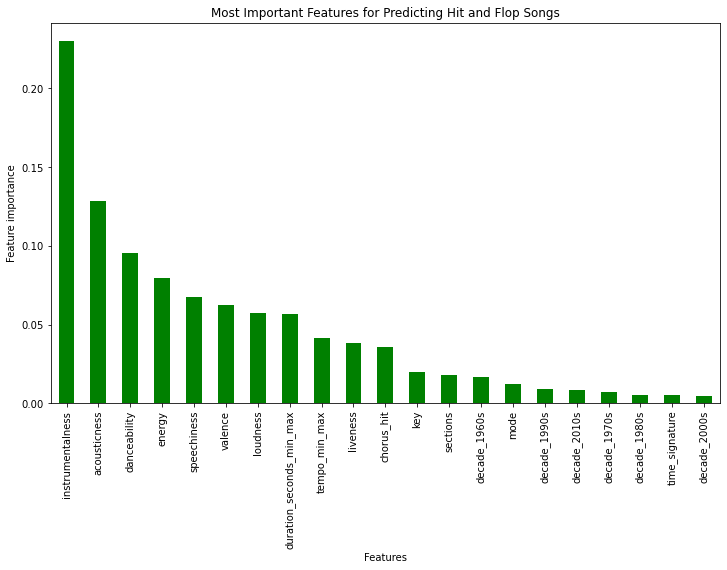

In [68]:
# Visualize feature importance
all_songs_feat_vars.plot(kind='bar', figsize=(12, 7), color = "green", title = "Most Important Features for Predicting Hit and Flop Songs", legend = None) 
plt.xlabel('Features')
plt.ylabel('Feature importance')
plt.show()

## 💃🏻🕺🏻Final Conclusions:
- The Random Forest Model preformed best and was the most well rounded model for the job
    - Accuracy on validate was 77%
    - Validate Recall was 93%
    - Accuracy on Test 76% accuracy which was only slighly lower than our accuracy on validate set
    - Recall stayed almost the same high as well 92%
- The model had a 23% improvement on baseline preformance 🥳

## 📄 Recommendations:
 - Use model to optimize song selection for singles or inclusion in albums or concert setlists.
 - Use model feature importance paired with correlation found in exploratory data analysis to determine song features during creative process.
     - Hit songs tend to be less instrumental meaning songs with words tend to be hits vs songs without words.
     - The more danceable a song, the more likely it is to be a hit
     - the higher the energy of a song, the more likely it is to be a hit.


## ↗️ Future Iterations of Project:
- I would also like to model the data using XGboost
- I would love to model by decade to see the impact on decade to feature importance with modeling and in exploratory data analysis
 - Dive deeper into features to determine if encoding would help improve model preformance.